# 2.4 Multivariate Examples

In the previous notebook, we used gradient methods to find minimum of function of one variable.
In this notebook, we will use the previous methods to find location of the minimum of functions of two variables.  

In [3]:
using CairoMakie
using LinearAlgebra

Declare structs to store the store the intermediate solutions

In [4]:
struct Point2D
    x1::Float64
    x2::Float64
    fvalue::Float64
end

---

# **Example 2.4.1**

* Let's now try to find the minimum of a two-dimensional function
$f(x)=x_1^2+x_2^2$. 

 * As was seen in the previous examples, to use gradient methods to find the minimum of a function, you need the gradients.  Since this is a two dimensional function, its gradient is a two dimensional vector, $\nabla f =\vec{g}=\begin{Bmatrix} \partial f/\partial x_1\\ \partial f/\partial x_2\end{Bmatrix}=\begin{Bmatrix} 2x_1\\2x_2\end{Bmatrix}$

* This function has a local minimum at $(x_1,x_2)=(0.0,0.0)$


* Since this is a two dimensional function, we can visualise using a  a contour plot


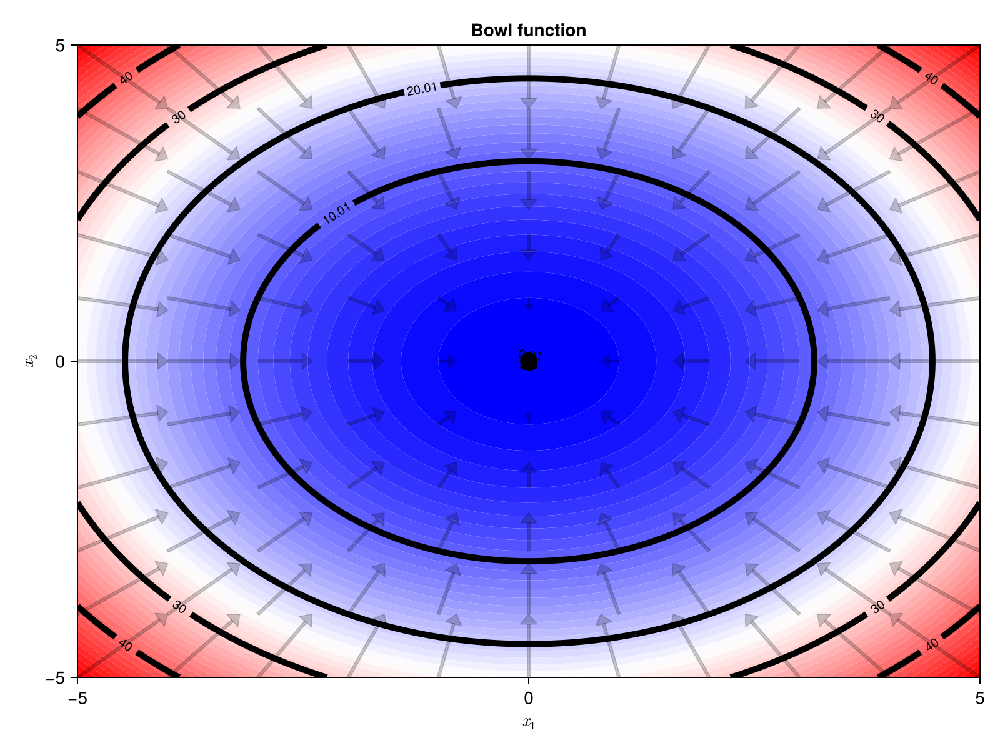

CairoMakie.Screen{IMAGE}


In [5]:
x1range=-5:0.02:5;
x2range=-5:0.02:5;
bowl(x)=x[1]^2+x[2]^2

function Gradient_bowl(x)
    d1=2*x[1]
    d2=2*x[2]
    return [d1,d2]
end

funcplot = [bowl([x1,x2]) for x1 in x1range, x2 in x2range]

x = [(x1i, x2i) for x1i in x1range, x2i in x2range]
fig = Figure(size=(800, 600))
ax = Axis(fig[1, 1], xlabel = L"x_1", ylabel = L"x_2",title = "Bowl function",limits=(-5,5.0,-5.0,5.0))
levels = range(0.01, 50; length=6)
contourf!(ax,x1range,x2range,funcplot; levels=50, colormap=:bwr)
contour!(ax,x1range,x2range,funcplot; labels=true, levels, color=:black, linewidth = 5)
scatter!(ax,[0],[0],color=:black,markersize=20)

x1range_arrow=-5:1:5;
x2range_arrow=-5:1:5;
arrowplot = [Gradient_bowl([x1,x2]) for x1 in x1range_arrow, x2 in x2range_arrow]
arrows2d!(ax,x1range_arrow,x2range_arrow,-getindex.(arrowplot,1),-getindex.(arrowplot,2);color=(:black, 0.2),lengthscale = 0.1)

# Save as PNG
save("../figures/my_plot.png", fig)
display(fig)

* The arrows in the plot above shows the direction of the negative of the gradient of $f(x)$, $-\nabla f(x)$.  
* Note that all the arrows point to the direction of the minimum of the function $f(x)$.  So if we just "follow" the arrows, we should move towards the local minimum.  
* This is the main idea behind the standard gradient descent method, to always move in the the opposite direction of the gradient of the function you are trying to optimize.

## Example 2.4.1 with Standard Gradient Descent

Try standard gradient descent method with update equations given by 

$\vec{x}^{(k+1)}=\vec{x}^{(k)}+\alpha\vec{g}^{(k)}$

Recall that $\alpha$ is a constant and all  variables with an arrow on top are vectors in this notebook.

Written explicitly, the gradient descent method for a function of two variables $f(x_1,x_2)$ is shown below

\begin{equation}
\begin{Bmatrix}
   x_1^{(k+1)} \\ 
      x_2^{(k+1)} 
\end{Bmatrix}=\begin{Bmatrix}
   x_1^{(k)} \\ 
      x_2^{(k)} \\ 
\end{Bmatrix}+\alpha\begin{Bmatrix}
   \frac{\partial f}{\partial x_1}(x_1^{(k)},x_2^{(k)}) \\ 
      \frac{\partial f}{\partial x_2}(x_1^{(k)},x_2^{(k)}) 
\end{Bmatrix}
\end{equation}


The code below uses standard gradient descent to find the local minimum.

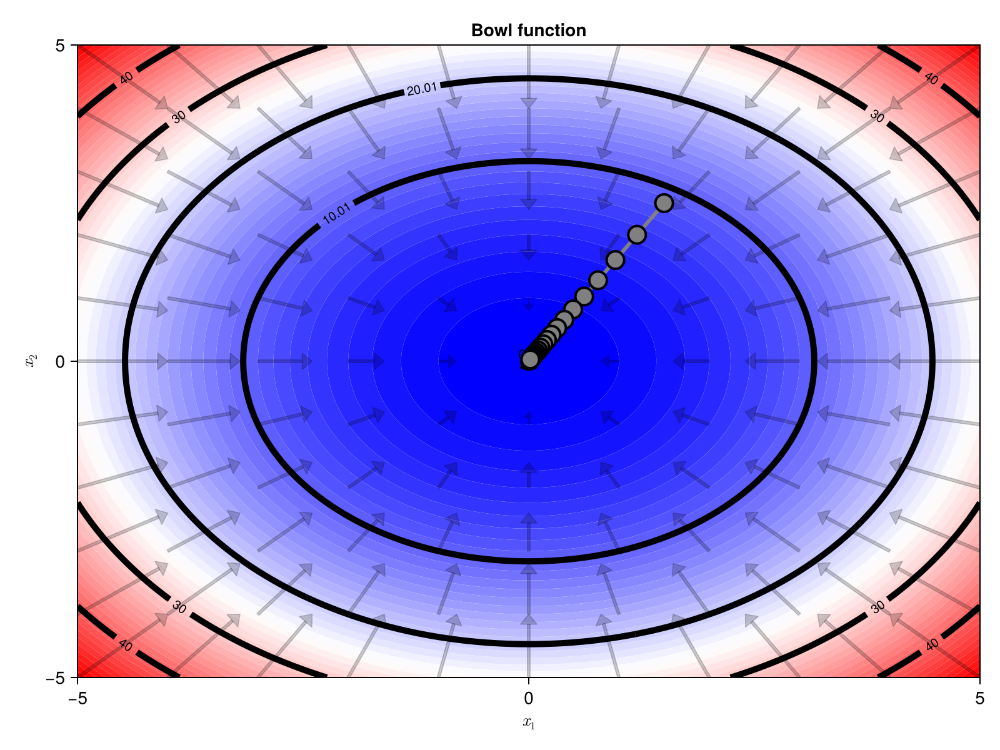

CairoMakie.Screen{IMAGE}


In [6]:
x0=[1.5,2.5] #initial guess x0.  Since this is a two-dimensional function, you need two guesses, one for x1 and another for x2
alpha=0.1 #learning rate
data=[Point2D(x0...,bowl(x0))]
x=x0
for i in 1 : 20
    x-=alpha*Gradient_bowl(x)
    push!(data,Point2D(x...,bowl(x)))
end
lines!(ax,getproperty.(data, :x1),getproperty.(data, :x2);linewidth=3,color=:grey) 
scatter!(ax,x0[1],x0[2],color=:blue,markersize=20)
scatter!(ax,getproperty.(data, :x1),getproperty.(data, :x2);color=:grey,markersize=20,strokecolor = :black,strokewidth = 2,) 

# Save as PNG
save("../figures/my_plot_02.png", fig)
display(fig)

* The gradient descent method (starting from the blue dot), follows the arrows (which is the negative of the gradient) and goes towards the local minimum (black dot)
* This is a very easy example and the standard gradient descent works very well.  We will now look at more complicated examples below.

-----

# **Example 2.4.2**

Try "Simple" quadratic function from "An Introduction to  the Conjugate Gradient Method  Without the Agonizing Pain"  Edition 1 1  4  Jonathan Richard Shewchuk  August 4, 1994

$f(x_1,x_2)=\frac{3}{2}x_1^2+2x_1x_2+3x_2^2-2x_1+8x_2$

<u>Exercise Ex01:</u> Compute $\partial f/\partial x_1$ and  $\partial f/\partial x_2$ and set them to zero to show that the minimum of this function occurs at $(x_1,x_2)=(2,-2)$.

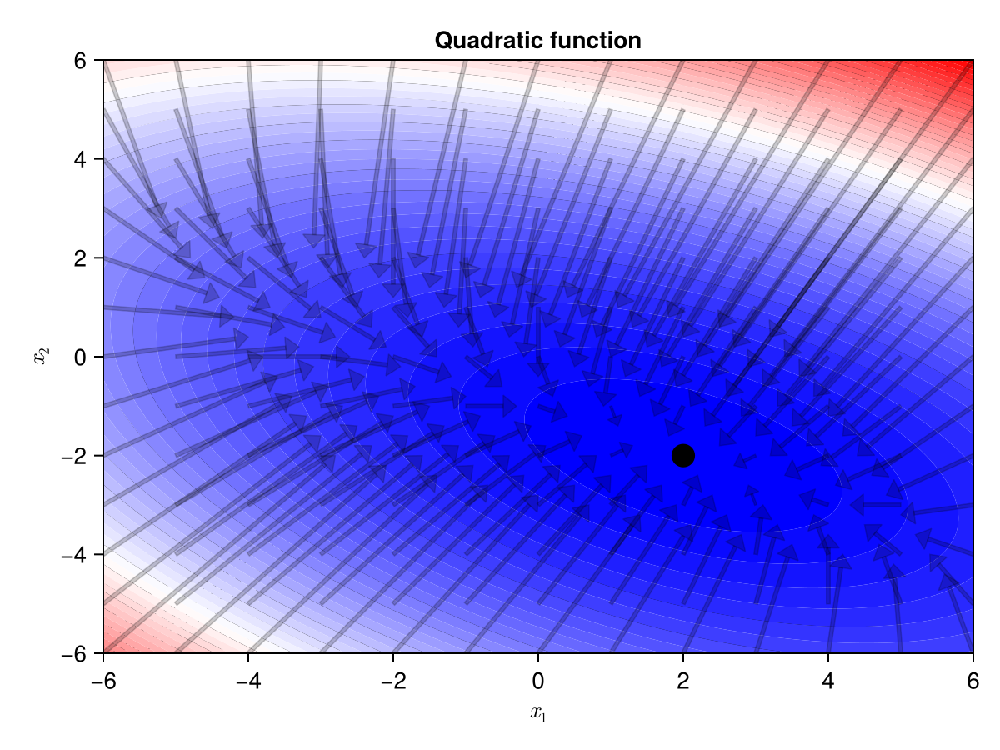

CairoMakie.Screen{IMAGE}


In [7]:
quad(x)=(3.0/2.0)*x[1]^2+2*x[1]*x[2]+3*x[2]^2-2*x[1]+8*x[2] # Define the function
function Gradient_quad(x)
    d1=3*x[1]+2*x[2]-2 #df/dx1
    d2=6*x[2]+2*x[1]+8 #df/dx2
    return [d1,d2]
end


function Hessian_quad(x)
    return [3 2;2 6] # This is the Hessian of the function which we will use later.
end

x1range=-6:0.02:6;
x2range=-6:0.02:6;
funcplot = [quad([x1,x2]) for x1 in x1range, x2 in x2range]


fig = Figure()
ax = Axis(fig[1, 1], xlabel = L"x_1", ylabel = L"x_2",title = "Quadratic function",limits=(-6,6.0,-6.0,6.0))
contour!(ax,x1range,x2range,funcplot; labels=true, levels=20,color=:black,linewidth = 5)
contourf!(ax,x1range,x2range,funcplot;  levels=50,colormap=:bwr)

x1range_arrow=-6:1:6;
x2range_arrow=-6:1:6;
arrowplot = [Gradient_quad([x1,x2]) for x1 in x1range_arrow, x2 in x2range_arrow]
arrows2d!(ax,x1range_arrow,x2range_arrow,-getindex.(arrowplot,1),-getindex.(arrowplot,2);color=(:black, 0.2),lengthscale = 0.1)

scatter!(ax,[2],[-2],color=:black,markersize=20)

# Save as PNG
save("../figures/my_plot_03.png", fig)
display(fig)

## Example 2.4.2 with Standard Gradient Descent

The code below uses the standard gradient descent method to find the local minimum of the quadratic function defined above.

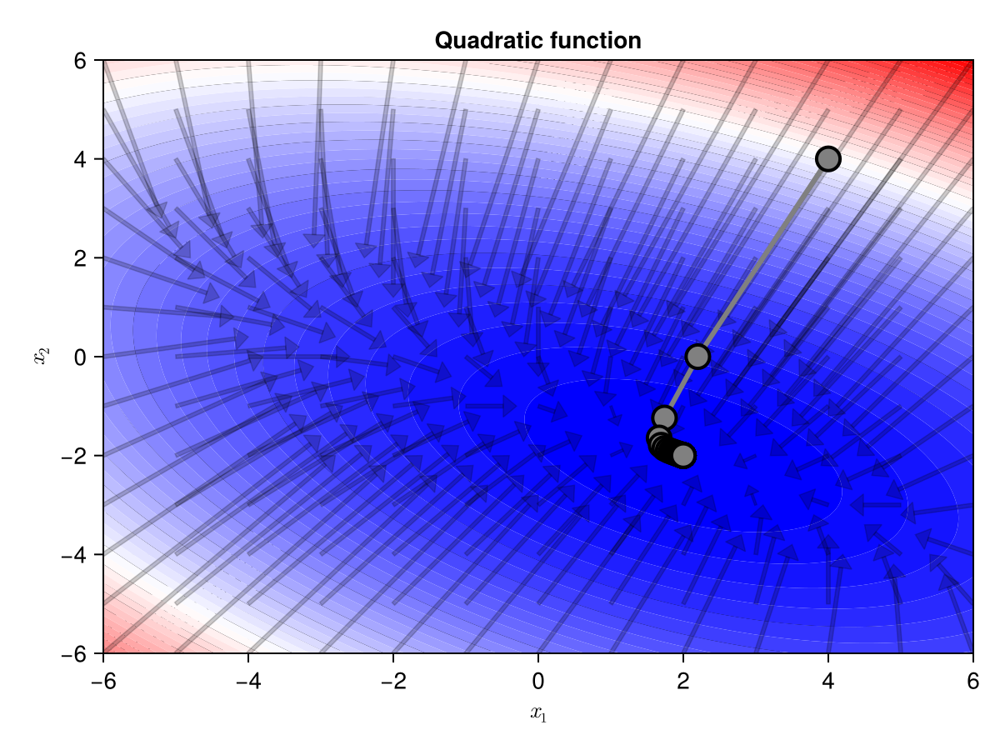

In [8]:
x0=[4.0,4.0] #initial guess of xm
alpha=0.1 #learning rate
data=[Point2D(x0...,quad(x0))]

x=x0

for i in 1 : 50
    x-=alpha*Gradient_quad(x)
    push!(data,Point2D(x...,quad(x)))
end

lines!(ax,getproperty.(data, :x1),getproperty.(data, :x2);linewidth=3,color=:grey,label="Gradient Descent") 
scatter!(ax,getproperty.(data, :x1),getproperty.(data, :x2);color=:grey,markersize=20,strokecolor = :black,strokewidth = 2,) 

#scatter!(ax,x0[1],x0[2],color=:blue,markersize=20)
fig

## Example 2.4.2 with Momentum

 The update equations for the momentum method for a function of two variables are
\begin{align}
\vec{v}^{(k+1)}&=\beta \vec{v}^{(k)}-\alpha \vec{g}^{(k)} \\
\vec{x}^{(k+1)}&=\vec{x}^{(k)}+\vec{v}^{(k+1)}
\end{align}

where $\vec{g}^{(k)}= \nabla f(x^{(k)})$, $\alpha$ is the learning rate and $\beta$ is the momentum decay.   Sometimes writing things in vector form hides the details of what is going on.  It is useful to write it out explicitly and in two dimensions, the update equations for the momentum equations are

\begin{equation}
\begin{Bmatrix}
   v_1^{(k+1)} \\ 
      v_2^{(k+1)} 
\end{Bmatrix}=\beta\begin{Bmatrix}
   v_1^{(k)} \\ 
      v_2^{(k)} \\ 
\end{Bmatrix}-\alpha\begin{Bmatrix}
   \frac{\partial f}{\partial x_1}(x_1^{(k)},x_2^{(k)}) \\ 
      \frac{\partial f}{\partial x_2}(x_1^{(k)},x_2^{(k)}) 
\end{Bmatrix}
\end{equation}



\begin{equation}
\begin{Bmatrix}
   x_1^{(k+1)} \\ 
      x_2^{(k+1)} 
\end{Bmatrix}=\begin{Bmatrix}
   x_1^{(k)} \\ 
      x_2^{(k)} \\ 
\end{Bmatrix}+\begin{Bmatrix}
   v_1^{(k+1)} \\ 
      v_2^{(k+1)}
\end{Bmatrix}
\end{equation}

The Julia code to implement the momentum equations is given below

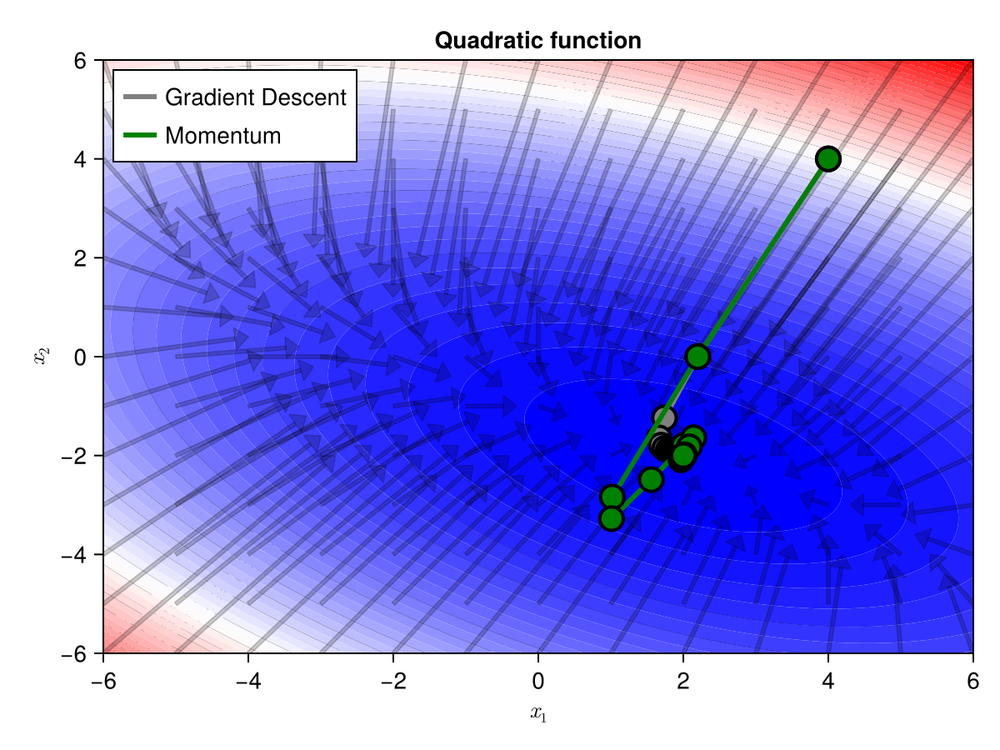

CairoMakie.Screen{IMAGE}


In [9]:
x0=[4.0,4.0] #initial guess of x0
alpha=0.1 #learning rate
beta=0.4 #momentum
v=[0.0,0.0]
data_m=[Point2D(x0...,quad(x0))]
x=x0
for i in 1 : 20
    v=beta*v.-alpha*Gradient_quad(x)
    x+=v
    push!(data_m,Point2D(x...,quad(x)))
end


lines!(ax,getproperty.(data_m, :x1),getproperty.(data_m, :x2),linewidth=3,color=:green,label="Momentum") 
scatter!(ax,getproperty.(data_m, :x1),getproperty.(data_m, :x2);color=:green,markersize=20,strokecolor = :black,strokewidth = 2,) 

axislegend(ax;position = :lt)

# Save as PNG
save("../figures/my_plot_04.png", fig)
display(fig)

---

**Class Demo 01:** Write a Julia program that implements the momentum method to find the minimum of the two dimensional function 

$f(x_1,x_2)=\frac{3}{2}x_1^2+2x_1x_2+3x_2^2-2x_1+8x_2$

---



## Example 2.4.2 with  Nesterov Momentum.  

Let's use Nesterov momentum.  The update equations for the Nesterov momentum method for a function of two variables are
\begin{align}
\vec{v}^{(k+1)}&=\beta \vec{v}^{(k)}-\alpha \vec{g}^{(k)} \\
\vec{x}^{(k+1)}&=\vec{x}^{(k)}+\vec{v}^{(k+1)}
\end{align}

where $\vec{g}^{(k)}= \nabla f(x^{(k)}+\beta v^{(k)})$

For two variables, the Nesterov Momentum update equations can be written as

\begin{equation}
\begin{Bmatrix}
   v_1^{(k+1)} \\ 
      v_2^{(k+1)} 
\end{Bmatrix}=\beta\begin{Bmatrix}
   v_1^{(k)} \\ 
      v_2^{(k)} \\ 
\end{Bmatrix}-\alpha\begin{Bmatrix}
   \frac{\partial f}{\partial x_1}(x_1^{(k)}+\beta v_1^{(k)},x_2^{(k)}+\beta v_2^{(k)}) \\ 
      \frac{\partial f}{\partial x_2}(x_1^{(k)}+\beta v_1^{(k)},x_2^{(k)}+\beta v_2^{(k)}) 
\end{Bmatrix}
\end{equation}

\begin{equation}
\begin{Bmatrix}
   x_1^{(k+1)} \\ 
      x_2^{(k+1)} 
\end{Bmatrix}=\begin{Bmatrix}
   x_1^{(k)} \\ 
      x_2^{(k)} \\ 
\end{Bmatrix}+\alpha\begin{Bmatrix}
   v_1^{(k+1)} \\ 
      v_2^{(k+1)}
\end{Bmatrix}
\end{equation}

The Julia code for the Nesterov momentum method is shown below.

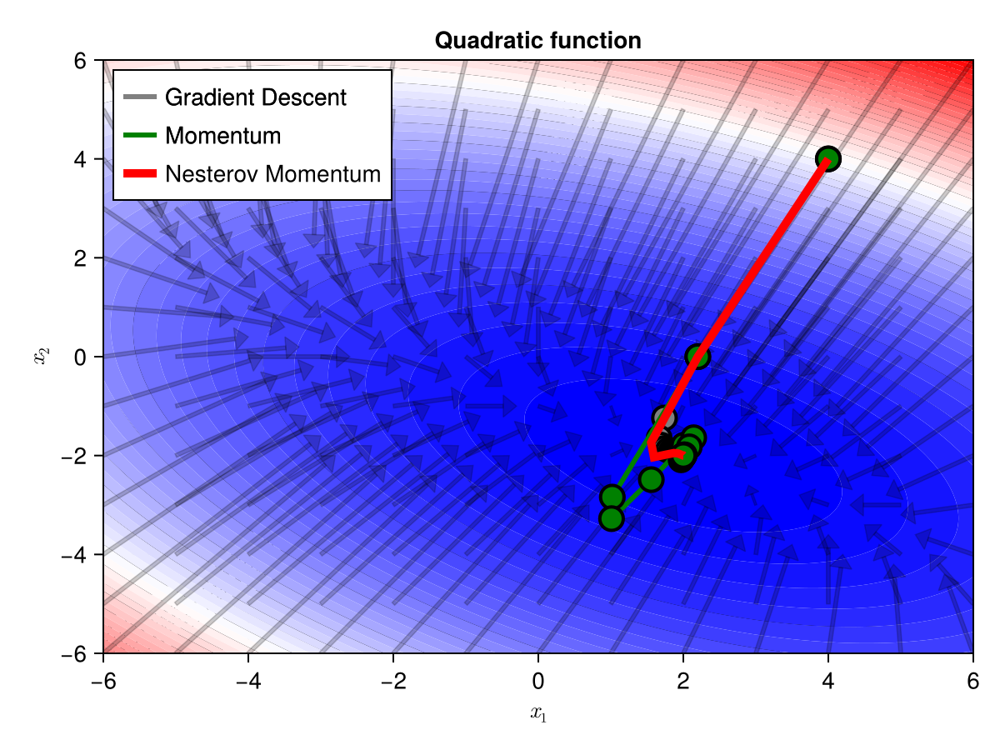

In [10]:
x0=[4.0,4.0] #initial guess of xm
alpha=0.1 #learning rate
beta=0.4
v=[0.0,0.0]
x=x0
data_nm=[Point2D(x0...,quad(x0))]
for i in 1 : 20
    v =beta*v-alpha*Gradient_quad(x+beta*v)
    x+=v
    push!(data_nm,Point2D(x...,quad(x)))
end

lines!(ax,getproperty.(data_nm, :x1),getproperty.(data_nm, :x2),linewidth=5,color=:red,label="Nesterov Momentum") 
axislegend(ax;position = :lt)
fig

* As expected the Nesterov momentum method does not "bounce around" as much as the Momentum method.

As you can see from the example above, the Newton method converges very quickly for this method.  After only 1 iteration for this example.

---